In [1]:
import pandas as pd
import seaborn as sb
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.tree import plot_tree
from sklearn.tree import export_graphviz
import graphviz
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from scipy import stats
sb.set()

In [2]:
dataset = pd.read_csv('heart_2020_cleaned.csv')
dataset.head

<bound method NDFrame.head of        HeartDisease    BMI Smoking AlcoholDrinking Stroke  PhysicalHealth  \
0                No  16.60     Yes              No     No             3.0   
1                No  20.34      No              No    Yes             0.0   
2                No  26.58     Yes              No     No            20.0   
3                No  24.21      No              No     No             0.0   
4                No  23.71      No              No     No            28.0   
...             ...    ...     ...             ...    ...             ...   
319790          Yes  27.41     Yes              No     No             7.0   
319791           No  29.84     Yes              No     No             0.0   
319792           No  24.24      No              No     No             0.0   
319793           No  32.81      No              No     No             0.0   
319794           No  46.56      No              No     No             0.0   

        MentalHealth DiffWalking     Sex  Age

In [3]:
dataset = dataset.drop(dataset.query('HeartDisease == "No"').sample(frac=265049/292422).index)
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 54746 entries, 1 to 319790
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   HeartDisease      54746 non-null  object 
 1   BMI               54746 non-null  float64
 2   Smoking           54746 non-null  object 
 3   AlcoholDrinking   54746 non-null  object 
 4   Stroke            54746 non-null  object 
 5   PhysicalHealth    54746 non-null  float64
 6   MentalHealth      54746 non-null  float64
 7   DiffWalking       54746 non-null  object 
 8   Sex               54746 non-null  object 
 9   AgeCategory       54746 non-null  object 
 10  Race              54746 non-null  object 
 11  Diabetic          54746 non-null  object 
 12  PhysicalActivity  54746 non-null  object 
 13  GenHealth         54746 non-null  object 
 14  SleepTime         54746 non-null  float64
 15  Asthma            54746 non-null  object 
 16  KidneyDisease     54746 non-null  objec

# Exploratory Data Analysis

In [4]:
dataset.head()

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
1,No,20.34,No,No,Yes,0.0,0.0,No,Female,80 or older,White,No,Yes,Very good,7.0,No,No,No
2,No,26.58,Yes,No,No,20.0,30.0,No,Male,65-69,White,Yes,Yes,Fair,8.0,Yes,No,No
5,Yes,28.87,Yes,No,No,6.0,0.0,Yes,Female,75-79,Black,No,No,Fair,12.0,No,No,No
8,No,26.45,No,No,No,0.0,0.0,No,Female,80 or older,White,"No, borderline diabetes",No,Fair,5.0,No,Yes,No
10,Yes,34.30,Yes,No,No,30.0,0.0,Yes,Male,60-64,White,Yes,No,Poor,15.0,Yes,No,No


In [5]:
#Vital statistics for dataset
print("Data type : ", type(dataset))
print("Data dims : ", dataset.shape)

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dims :  (54746, 18)


In [6]:
Yes = dataset.loc[dataset["HeartDisease"] == 'Yes']
No = dataset.loc[dataset["HeartDisease"] == 'No']

In [7]:
#Check variables in the dataset
print(dataset.dtypes)

HeartDisease         object
BMI                 float64
Smoking              object
AlcoholDrinking      object
Stroke               object
PhysicalHealth      float64
MentalHealth        float64
DiffWalking          object
Sex                  object
AgeCategory          object
Race                 object
Diabetic             object
PhysicalActivity     object
GenHealth            object
SleepTime           float64
Asthma               object
KidneyDisease        object
SkinCancer           object
dtype: object


In [8]:
#Detailed information about variables in the dataset
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 54746 entries, 1 to 319790
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   HeartDisease      54746 non-null  object 
 1   BMI               54746 non-null  float64
 2   Smoking           54746 non-null  object 
 3   AlcoholDrinking   54746 non-null  object 
 4   Stroke            54746 non-null  object 
 5   PhysicalHealth    54746 non-null  float64
 6   MentalHealth      54746 non-null  float64
 7   DiffWalking       54746 non-null  object 
 8   Sex               54746 non-null  object 
 9   AgeCategory       54746 non-null  object 
 10  Race              54746 non-null  object 
 11  Diabetic          54746 non-null  object 
 12  PhysicalActivity  54746 non-null  object 
 13  GenHealth         54746 non-null  object 
 14  SleepTime         54746 non-null  float64
 15  Asthma            54746 non-null  object 
 16  KidneyDisease     54746 non-null  objec

## General Statistics for HeartDisease

In [9]:
print("HeartDisease:", len(dataset["HeartDisease"].unique()))
print(dataset["HeartDisease"].value_counts())

HeartDisease: 2
No     27373
Yes    27373
Name: HeartDisease, dtype: int64


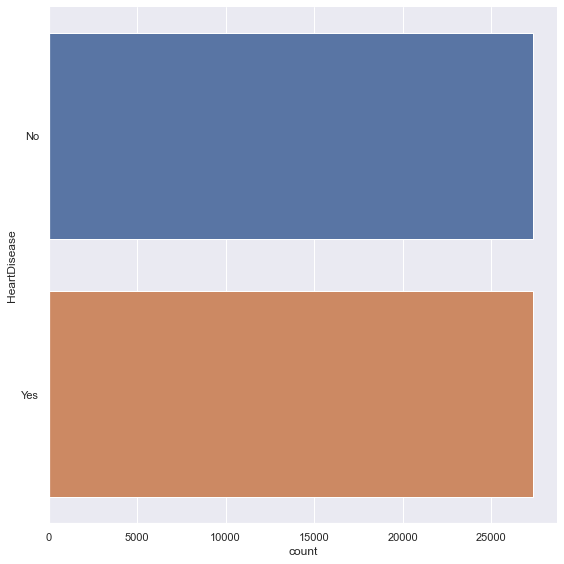

In [10]:
sb.catplot(y = "HeartDisease", data = dataset, kind = "count", height =8)

## Comparing AgeCategory against HeartDisease

AgeCategory: 13
70-74          7319
80 or older    7189
65-69          6883
60-64          6155
75-79          5664
55-59          4798
50-54          3608
45-49          2667
40-44          2416
35-39          2266
18-24          2122
30-34          1975
25-29          1684
Name: AgeCategory, dtype: int64


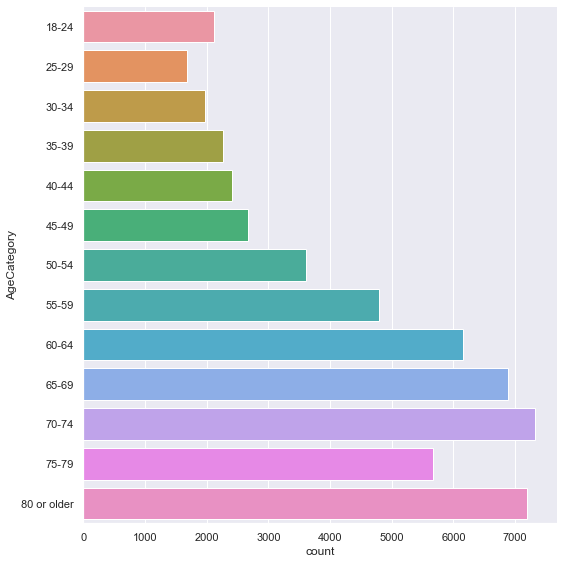

In [11]:
#General Statistics for AgeCategory
print("AgeCategory:", len(dataset["AgeCategory"].unique()))
print(dataset["AgeCategory"].value_counts())

sb.catplot(y = "AgeCategory", data = dataset, kind = "count", height = 8, order=['18-24','25-29','30-34','35-39','40-44','45-49','50-54','55-59','60-64','65-69','70-74','75-79','80 or older'])

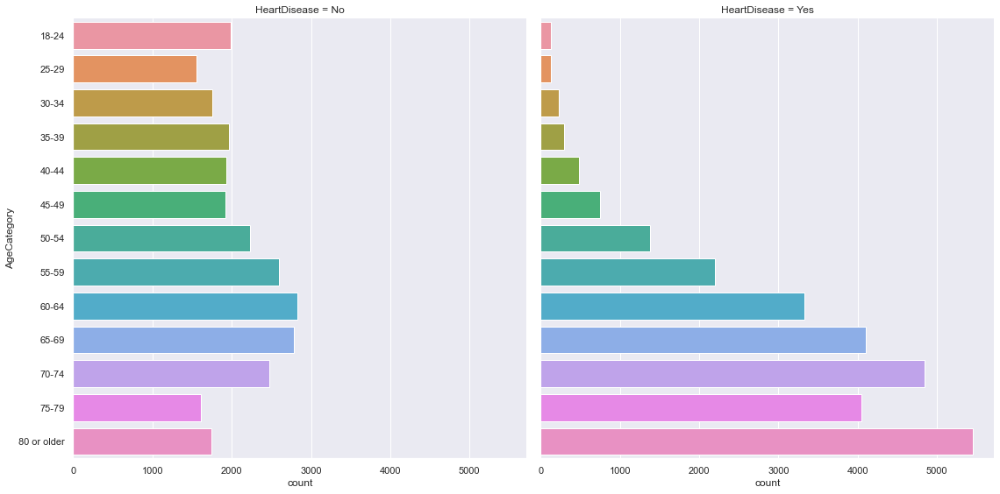

In [12]:
sb.catplot(y = 'AgeCategory', data = dataset, col = 'HeartDisease', kind = 'count', col_wrap = 2, height = 8, order=['18-24','25-29','30-34','35-39','40-44','45-49','50-54','55-59','60-64','65-69','70-74','75-79','80 or older'])

Older people aged in their 50s and above are more likely to suffer from heart disease.

## Comparing Sex against HeartDisease

Sex: 2
Male      28863
Female    25883
Name: Sex, dtype: int64


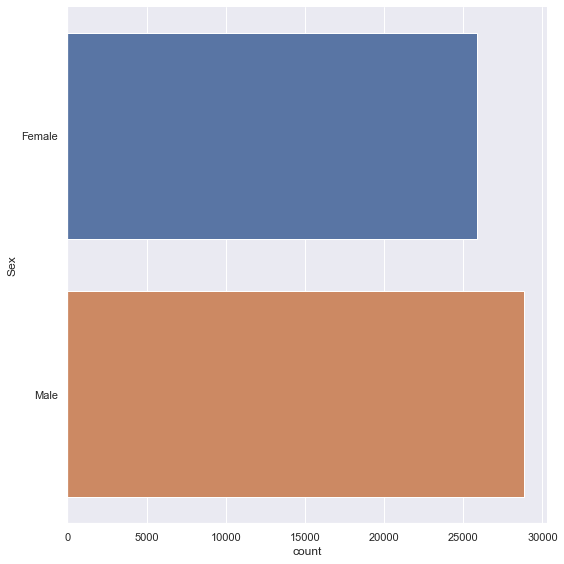

In [13]:
#General Statistics for Stroke
print("Sex:", len(dataset["Sex"].unique()))
print(dataset["Sex"].value_counts())

sb.catplot(y = "Sex", data = dataset, kind = "count", height=8)

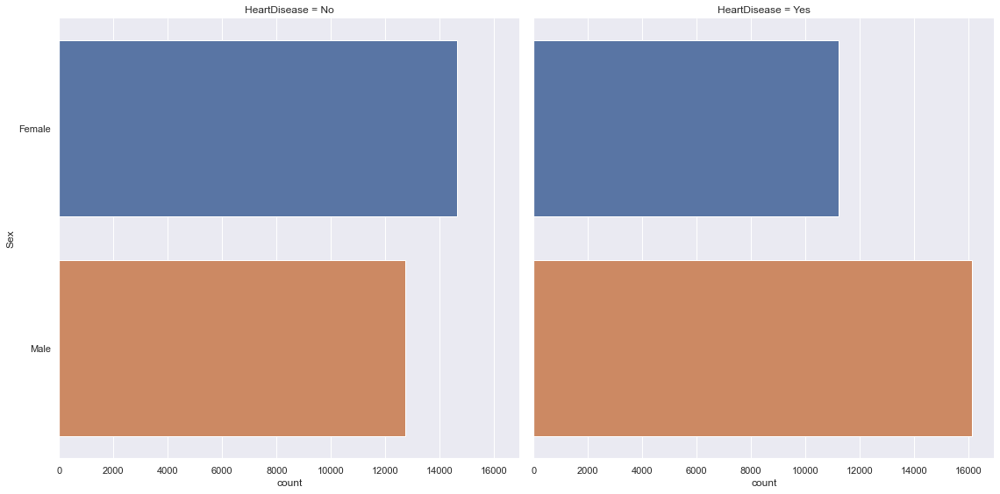

In [14]:
sb.catplot(y = 'Sex', data = dataset, col = 'HeartDisease', kind = 'count', col_wrap = 2, height = 8)

## Comparing BMI against HeartDisease

<AxesSubplot:xlabel='BMI', ylabel='HeartDisease'>

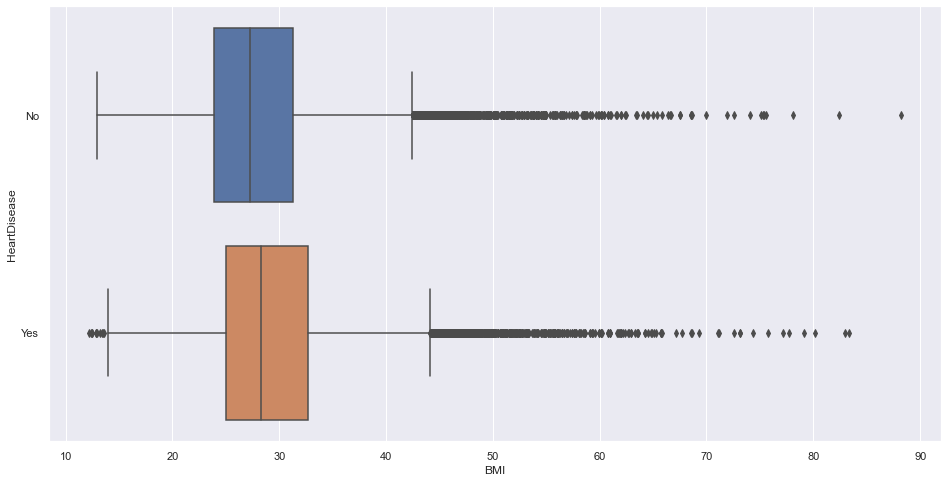

In [15]:
import matplotlib.pyplot as plt 

f = plt.figure(figsize=(16, 8))
sb.boxplot(data = dataset, x="BMI", y="HeartDisease", orient="h")

## Comparing Smoking against HeartDisease

First, let's look at some general statistics for Smoking:

In [16]:
print("Smoking:", len(dataset["Smoking"].unique()))
print(dataset["Smoking"].value_counts())

Smoking: 2
No     27786
Yes    26960
Name: Smoking, dtype: int64


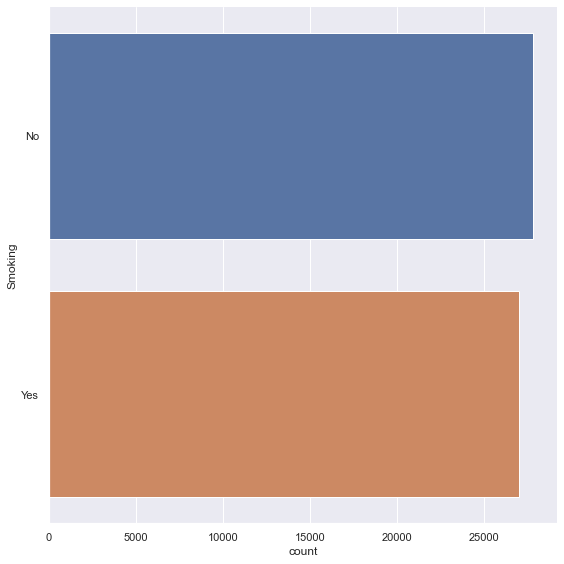

In [17]:
sb.catplot(y = "Smoking", data = dataset, kind = "count", height=8)

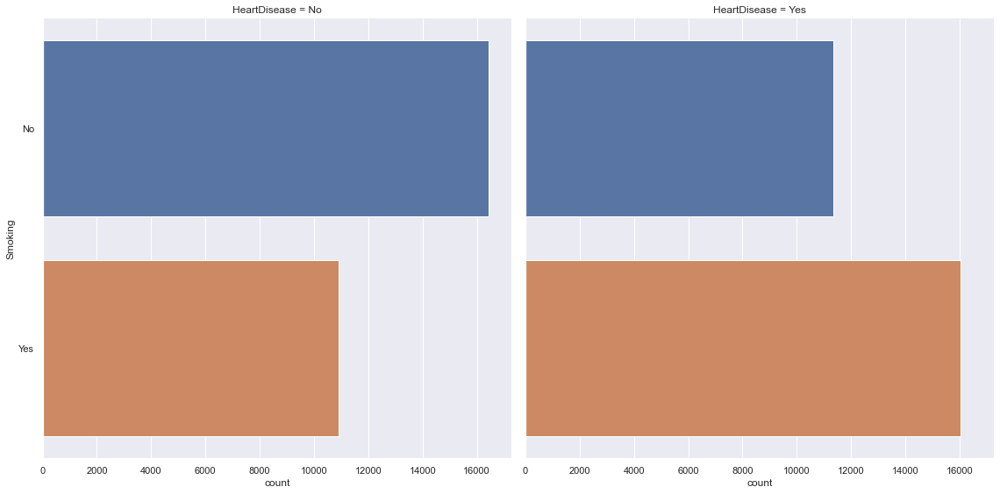

In [18]:
sb.catplot(y = 'Smoking', data = dataset, col = 'HeartDisease', kind = 'count', col_wrap = 2, height = 8)

There are slightly more smokers than non-smokers who suffer from heart disease.

## Comparing AlcoholDrinking against HeartDisease

AlcoholDrinking: 2
No     51649
Yes     3097
Name: AlcoholDrinking, dtype: int64


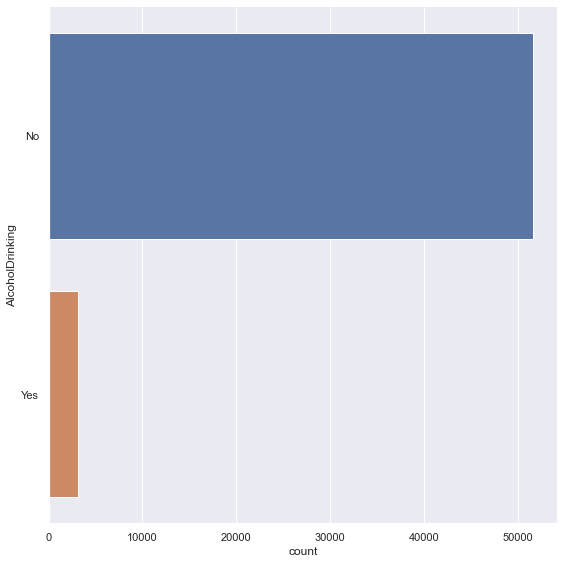

In [19]:
#General Statistics for AlcoholDrinking
print("AlcoholDrinking:", len(dataset["AlcoholDrinking"].unique()))
print(dataset["AlcoholDrinking"].value_counts())

sb.catplot(y = "AlcoholDrinking", data = dataset, kind = "count", height = 8)

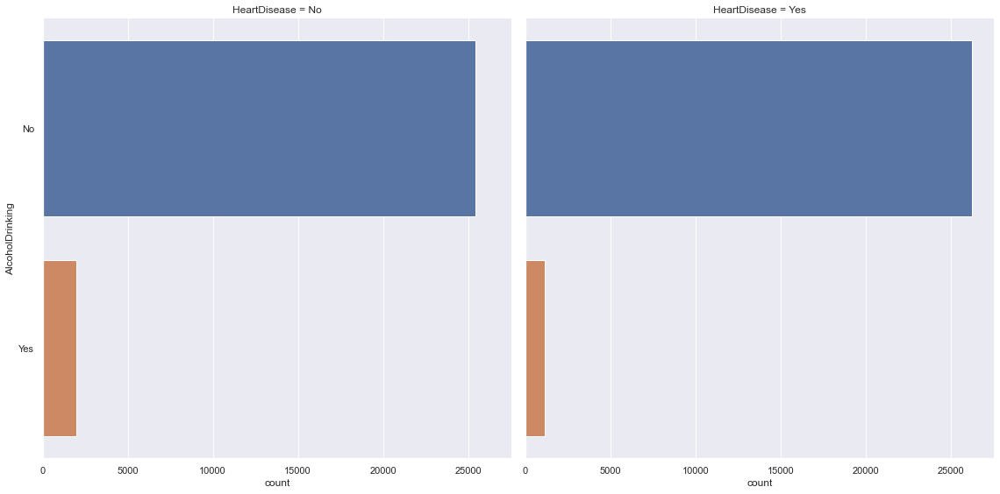

In [20]:
sb.catplot(y = 'AlcoholDrinking', data = dataset, col = 'HeartDisease', kind = 'count', col_wrap = 2, height = 8)

## Comparing Stroke against HeartDisease

Stroke: 2
No     49625
Yes     5121
Name: Stroke, dtype: int64


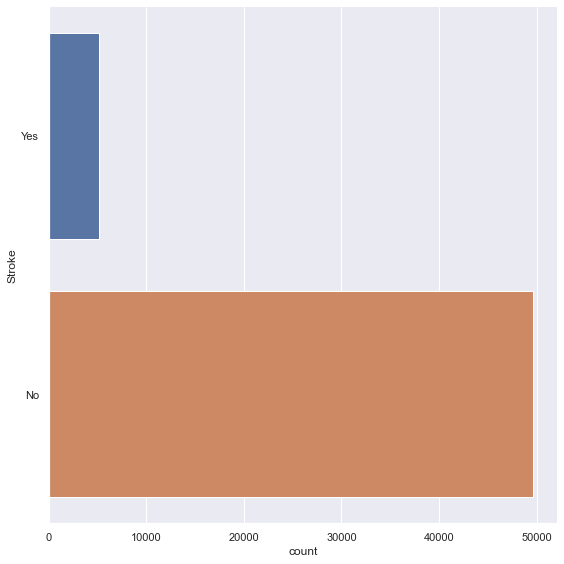

In [21]:
#General Statistics for Stroke
print("Stroke:", len(dataset["Stroke"].unique()))
print(dataset["Stroke"].value_counts())

sb.catplot(y = "Stroke", data = dataset, kind = "count", height = 8)

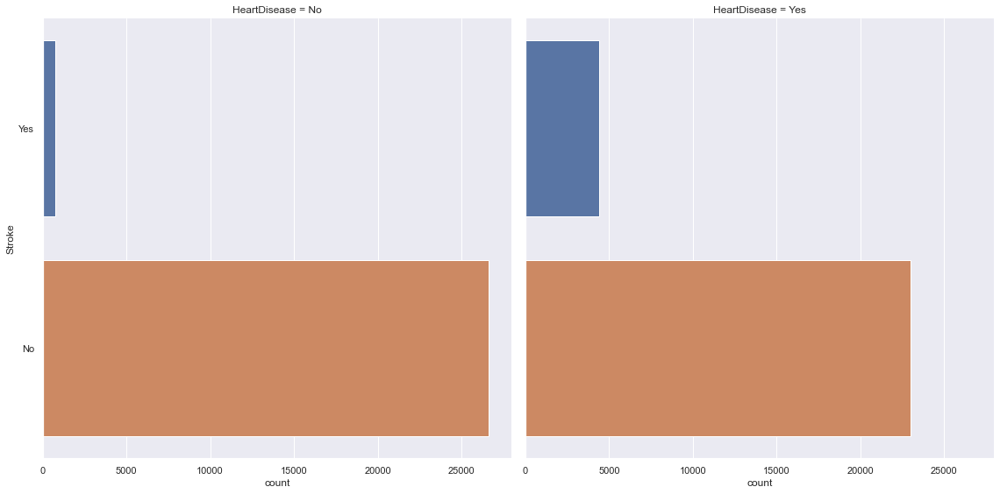

In [22]:
sb.catplot(y = 'Stroke', data = dataset, col = 'HeartDisease', kind = 'count', col_wrap = 2, height = 8)

## Comparing Diabetic against HeartDisease

Diabetic: 4
No                         41118
Yes                        11920
No, borderline diabetes     1378
Yes (during pregnancy)       330
Name: Diabetic, dtype: int64


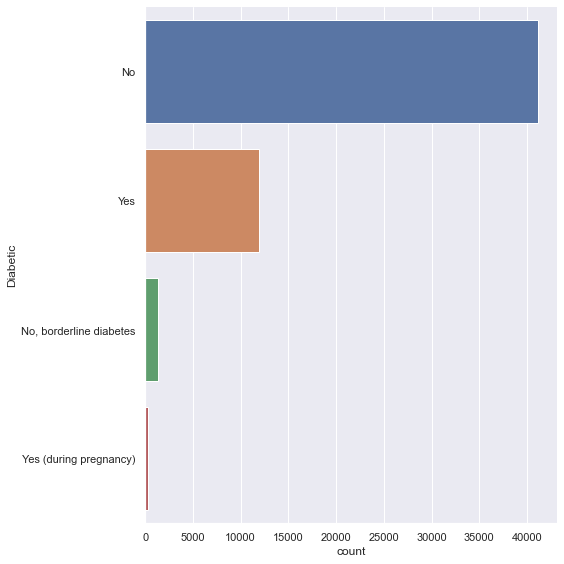

In [23]:
#General Statistics for Diabetic
print("Diabetic:", len(dataset["Diabetic"].unique()))
print(dataset["Diabetic"].value_counts())

sb.catplot(y = "Diabetic", data = dataset, kind = "count", height = 8)

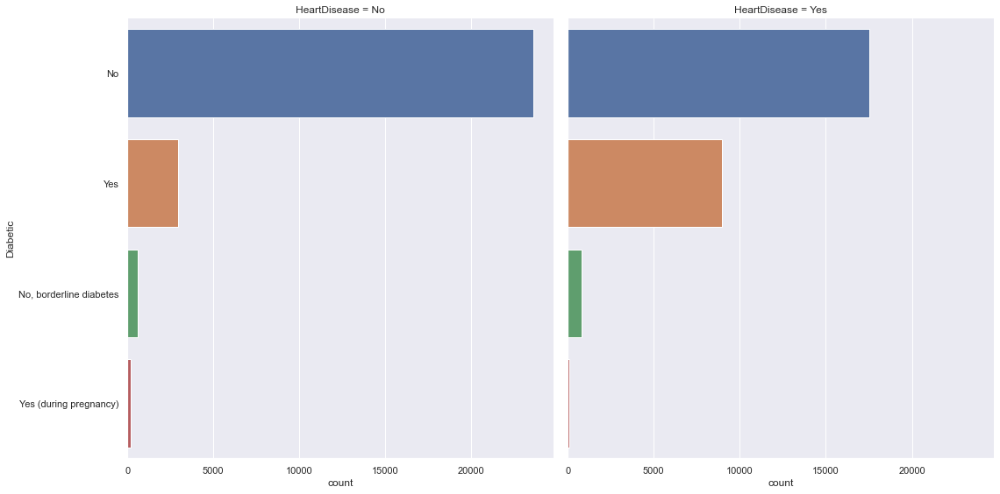

In [24]:
sb.catplot(y = 'Diabetic', data = dataset, col = 'HeartDisease', kind = 'count', col_wrap = 2, height = 8)

For those suffering from heart disease, there are a large number who do not have diabetes, though there is still a significant number of heart disease sufferers who are either diabetic or pre-diabetic.

## Comparing PhysicalActivity against HeartDisease

PhysicalActivity: 2
Yes    39143
No     15603
Name: PhysicalActivity, dtype: int64


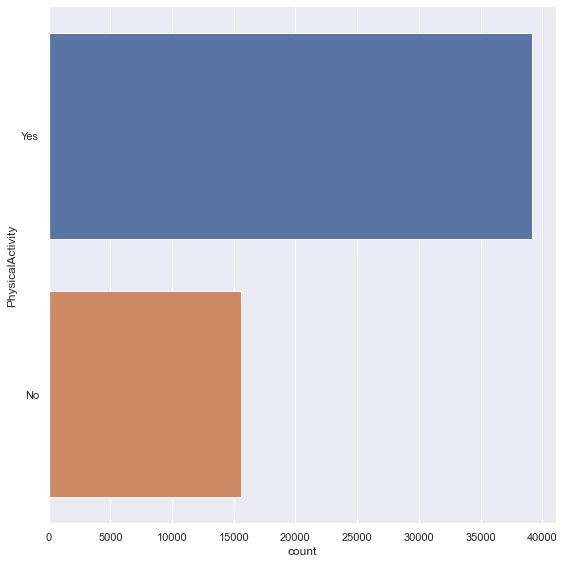

In [25]:
#General Statistics for Physical Activity
print("PhysicalActivity:", len(dataset["PhysicalActivity"].unique()))
print(dataset["PhysicalActivity"].value_counts())

sb.catplot(y = "PhysicalActivity", data = dataset, kind = "count", height=8)

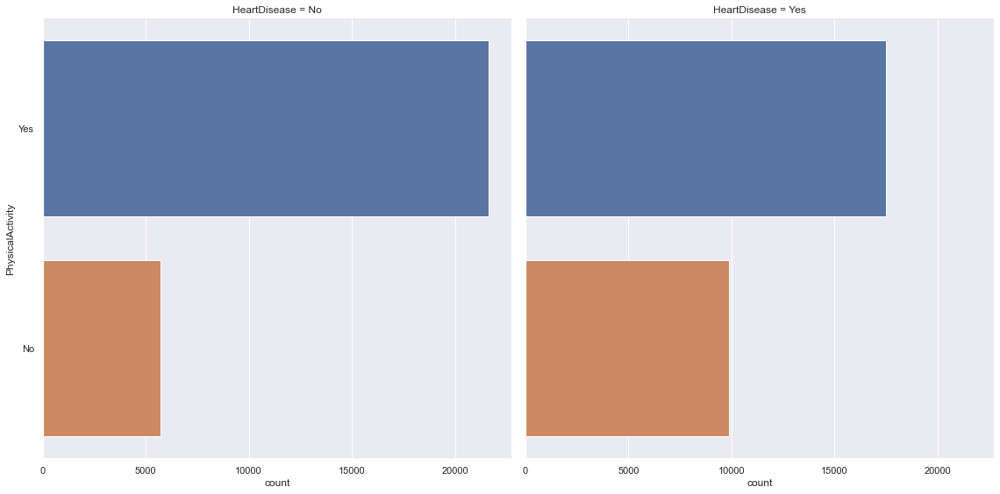

In [26]:
sb.catplot(y = 'PhysicalActivity', data = dataset, col = 'HeartDisease', kind = 'count', col_wrap = 2, height = 8)

## Comparing GenHealth against HeartDisease

GenHealth: 5
Good         17268
Very good    15665
Fair          9658
Excellent     7642
Poor          4513
Name: GenHealth, dtype: int64


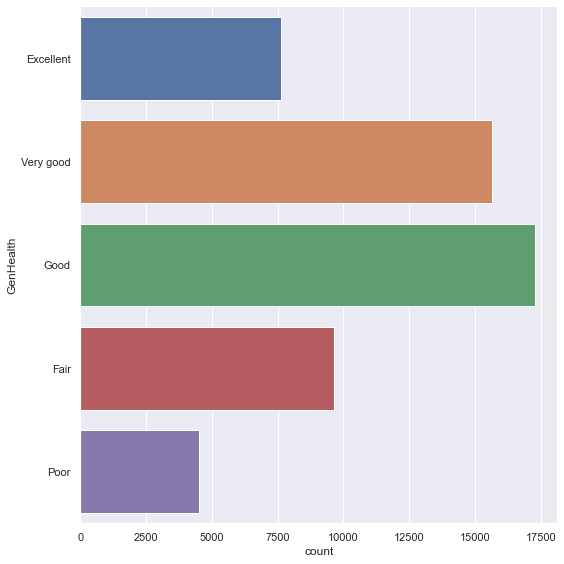

In [27]:
#General Statistics for GenHealth
print("GenHealth:", len(dataset["GenHealth"].unique()))
print(dataset["GenHealth"].value_counts())

sb.catplot(y = "GenHealth", data = dataset, kind = "count", height=8, order=['Excellent','Very good','Good','Fair','Poor'])

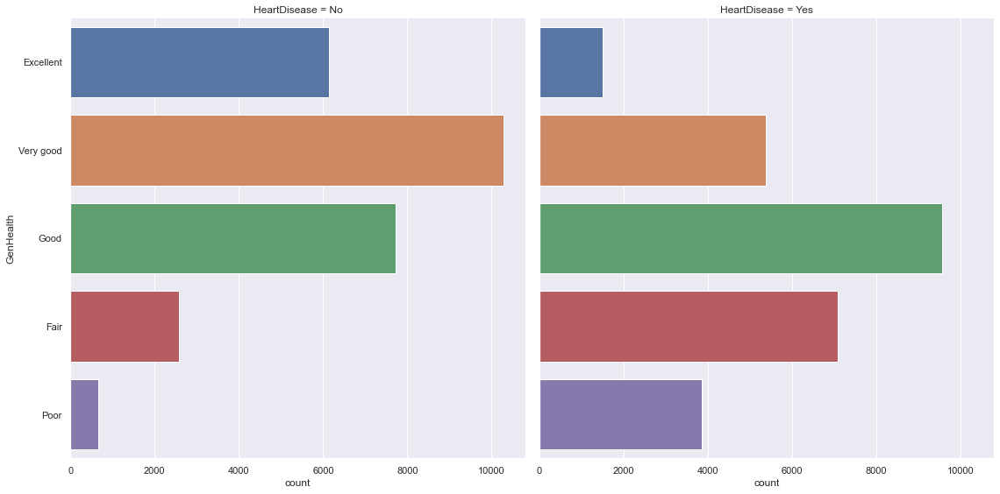

In [28]:
sb.catplot(y = 'GenHealth', data = dataset, col = 'HeartDisease', kind = 'count', col_wrap = 2, height = 8, order=['Excellent','Very good','Good','Fair','Poor'])

In general, there was a greater proportion of heart disease sufferers whose general health was less than ideal, as compared to non-heart disease sufferers. This could be due to the prevalence of certain underlying heart conditions such as high blood pressure, high cholesterol etc., however the specifics of any of these conditions are not stated in this dataset. Aside from diabetes, it would be difficult to determine from this dataset as to which other health conditions may be a potential risk factor that could increase the risk of suffering from heart disease.

## Comparing SleepTime against HeartDisease

<AxesSubplot:xlabel='SleepTime', ylabel='HeartDisease'>

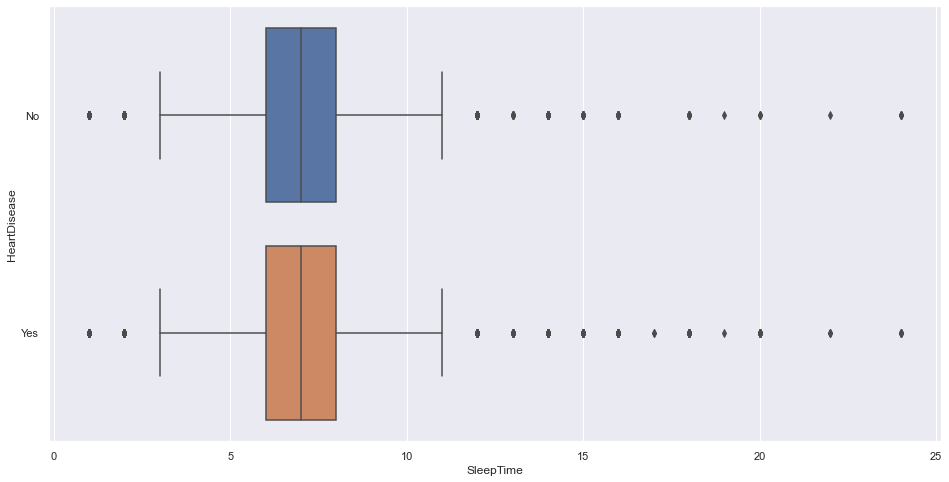

In [29]:
f = plt.figure(figsize=(16, 8))
sb.boxplot(data = dataset, x="SleepTime", y="HeartDisease", orient="h")

Since there is an overlap in the range of sleep time between heart disease sufferers and non-heart disease sufferers, it is not really a good predictor in determining the risk of suffering from heart disease.

## Comparing PhysicalHealth against HeartDisease

Within the context of the dataset, respondents were asked to indicate the number of days within the past 30 days where they perceived their own physical health to be poor. The number of days that they filled out was noted down under this variable PhysicalHealth.

<AxesSubplot:xlabel='PhysicalHealth', ylabel='HeartDisease'>

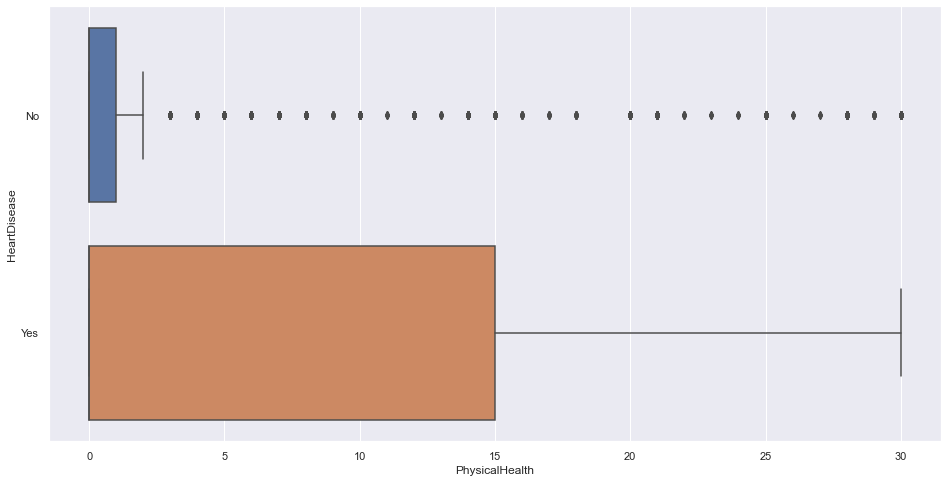

In [30]:
f = plt.figure(figsize=(16, 8))
sb.boxplot(data = dataset, x="PhysicalHealth", y="HeartDisease", orient="h")

Taking a closer look at data for this variable, with regard to heart disease sufferers:

<AxesSubplot:xlabel='PhysicalHealth', ylabel='Count'>

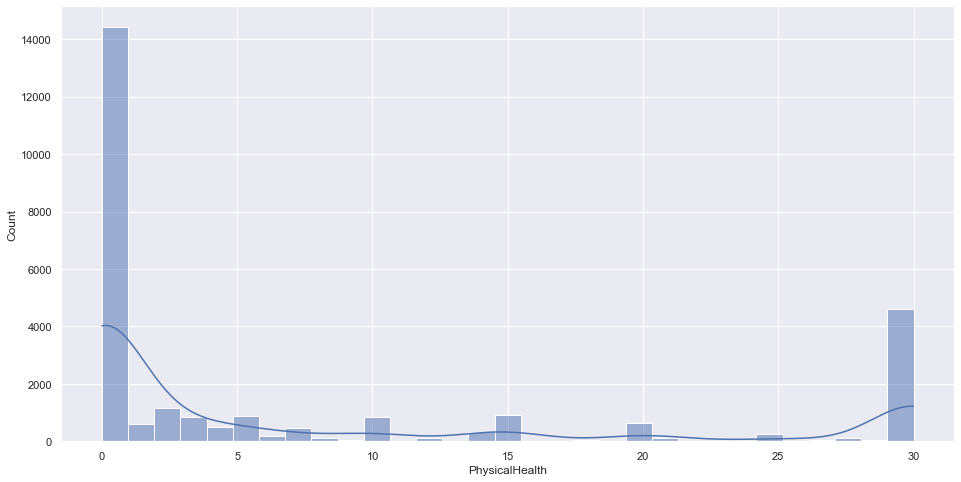

In [31]:
f = plt.figure(figsize=(16, 8))
sb.histplot(data = Yes, x="PhysicalHealth", kde = True)

And again for non-heart disease sufferers:

<AxesSubplot:xlabel='PhysicalHealth', ylabel='Count'>

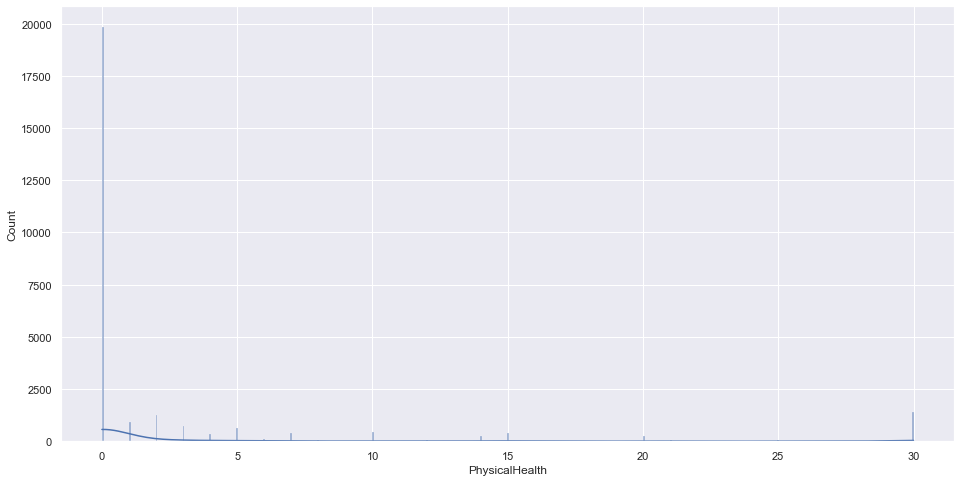

In [32]:
f = plt.figure(figsize=(16, 8))
sb.histplot(data = No, x="PhysicalHealth", kde=True)

## Comparing MentalHealth against HeartDisease

Similar to PhysicalHealth, respondents were asked to indicate the number of days within the past 30 days where they perceived their own mental health to be poor. The number of days that they filled out was noted down under this variable MentalHealth.

<AxesSubplot:xlabel='MentalHealth', ylabel='HeartDisease'>

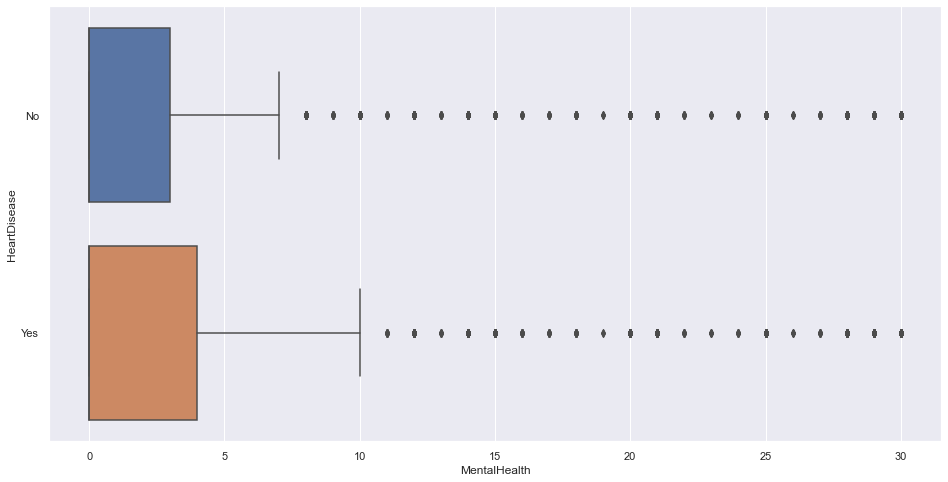

In [33]:
f = plt.figure(figsize=(16, 8))
sb.boxplot(data = dataset, x="MentalHealth", y="HeartDisease", orient="h")

Taking a closer look at individual data for heart disease suffers and non-heart disease sufferers:

<AxesSubplot:xlabel='MentalHealth', ylabel='Count'>

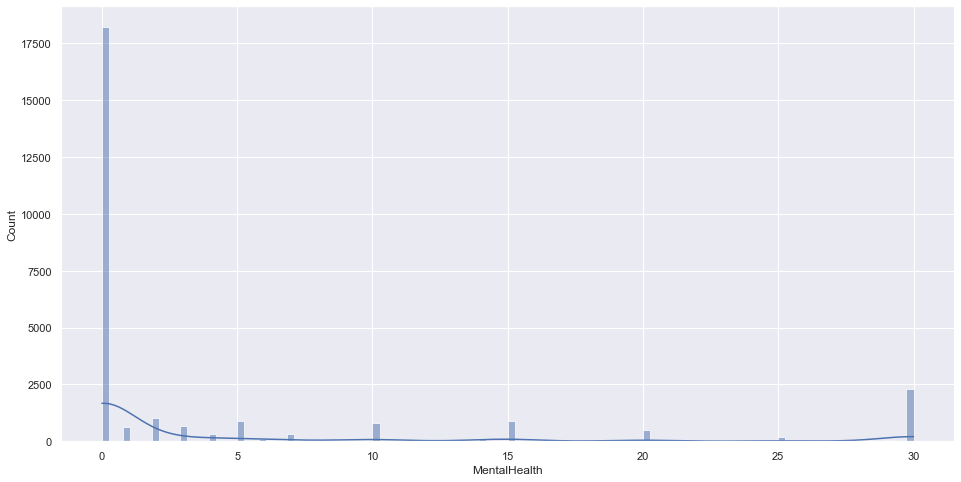

In [34]:
f = plt.figure(figsize=(16, 8))
sb.histplot(data = Yes, x="MentalHealth", kde = True)

<AxesSubplot:xlabel='MentalHealth', ylabel='Count'>

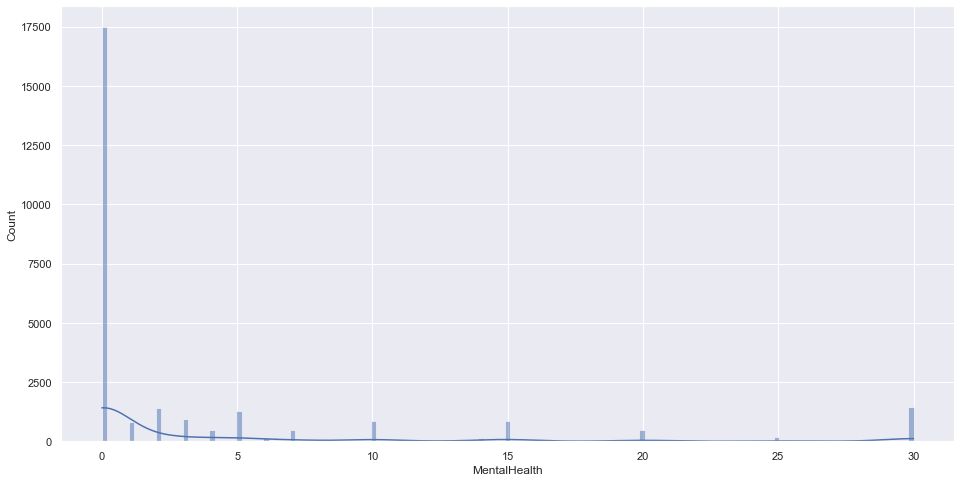

In [35]:
f = plt.figure(figsize=(16, 8))
sb.histplot(data = No, x="MentalHealth", kde = True)

Generally, these two variables are not very conclusive at predicting the likelihood of suffering from HeartDisease, since they are based on the respondents' perceptions of their own conditions, and may not necessarily reflect their actual conditions.

## Comparing KidneyDisease against HeartDisease

KidneyDisease: 2
No     50555
Yes     4191
Name: KidneyDisease, dtype: int64


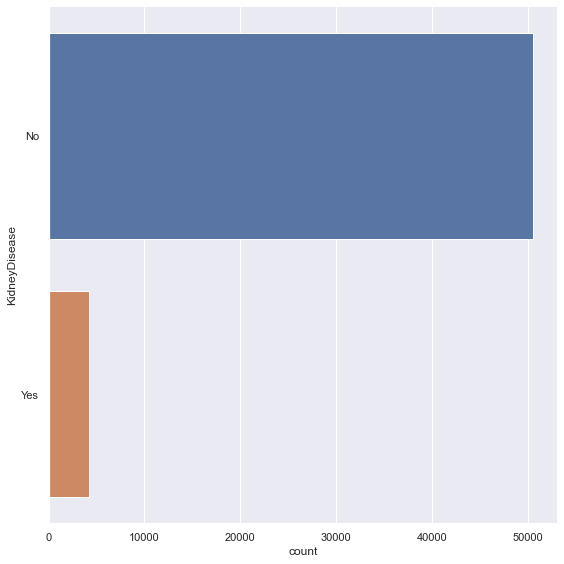

In [36]:
#General Statistics for KidneyDisease
print("KidneyDisease:", len(dataset["KidneyDisease"].unique()))
print(dataset["KidneyDisease"].value_counts())

sb.catplot(y = "KidneyDisease", data = dataset, kind = "count", height=8)

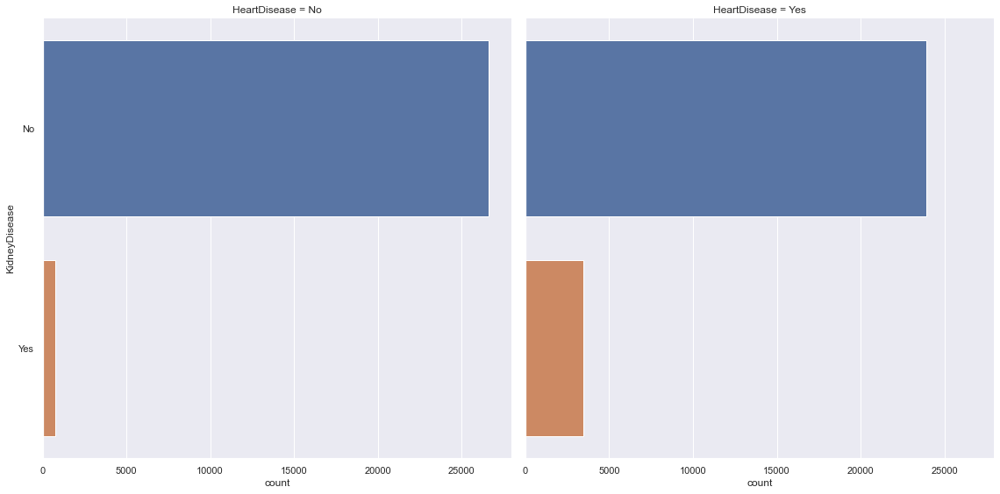

In [37]:
sb.catplot(y = 'KidneyDisease', data = dataset, col = 'HeartDisease', kind = 'count', col_wrap = 2, height = 8)

## Comparing SkinCancer against HeartDisease

SkinCancer: 2
No     47540
Yes     7206
Name: SkinCancer, dtype: int64


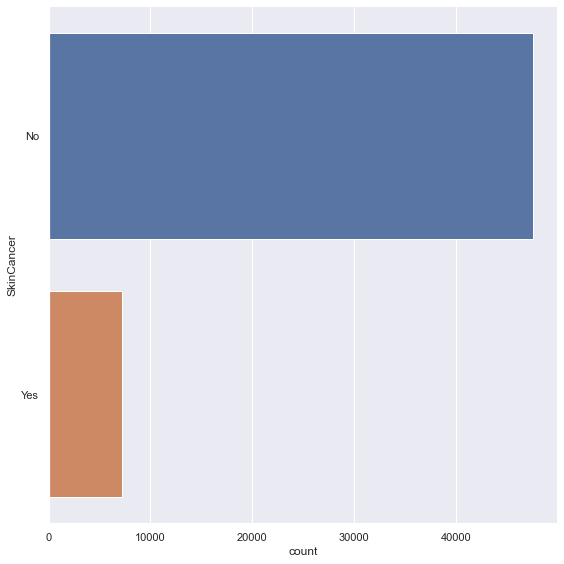

In [38]:
#General Statistics for SkinCancer
print("SkinCancer:", len(dataset["SkinCancer"].unique()))
print(dataset["SkinCancer"].value_counts())

sb.catplot(y = "SkinCancer", data = dataset, kind = "count", height = 8)

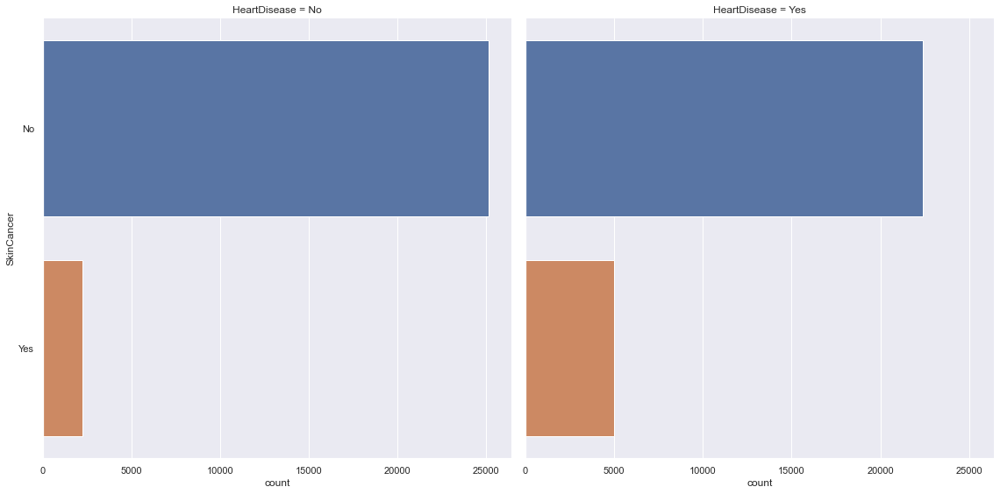

In [39]:
sb.catplot(y = 'SkinCancer', data = dataset, col = 'HeartDisease', kind = 'count', col_wrap = 2, height = 8)

## Comparing Asthma against HeartDisease

Asthma: 2
No     46306
Yes     8440
Name: Asthma, dtype: int64


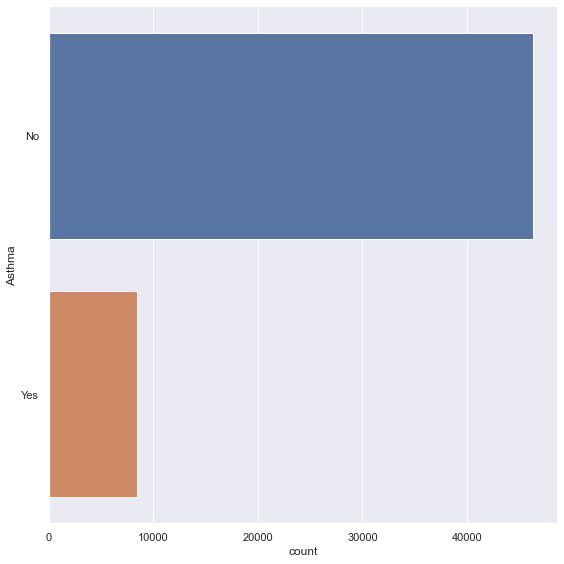

In [40]:
#General Statistics for Asthma
print("Asthma:", len(dataset["Asthma"].unique()))
print(dataset["Asthma"].value_counts())

sb.catplot(y = "Asthma", data = dataset, kind = "count", height=8)

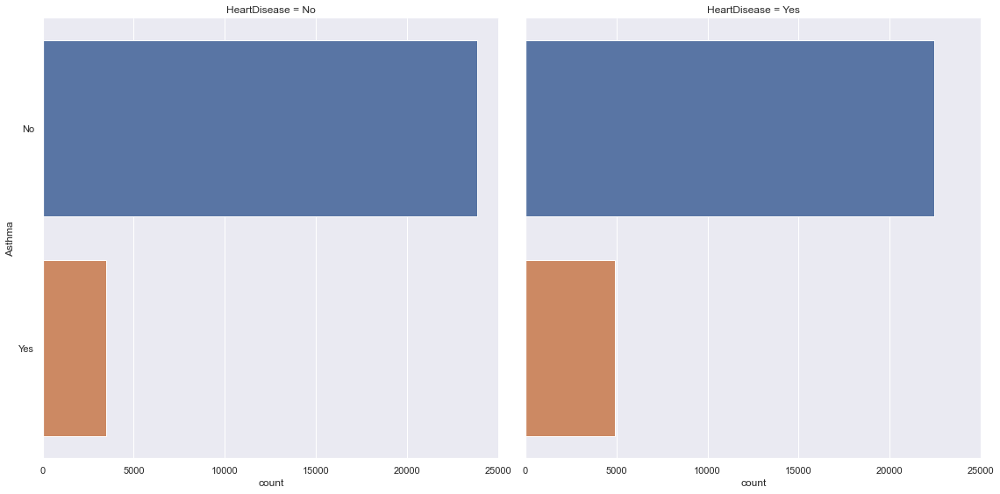

In [41]:
sb.catplot(y = 'Asthma', data = dataset, col = 'HeartDisease', kind = 'count', col_wrap = 2, height = 8)

## Comparing HeartDisease against DiffWalking

DiffWalking: 2
No     41539
Yes    13207
Name: DiffWalking, dtype: int64


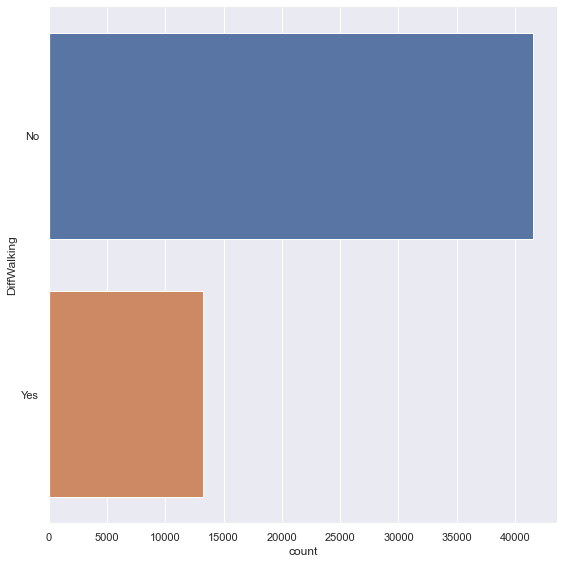

In [42]:
#General Statistics for DiffWalking
print("DiffWalking:", len(dataset["DiffWalking"].unique()))
print(dataset["DiffWalking"].value_counts())

sb.catplot(y = "DiffWalking", data = dataset, kind = "count", height=8)

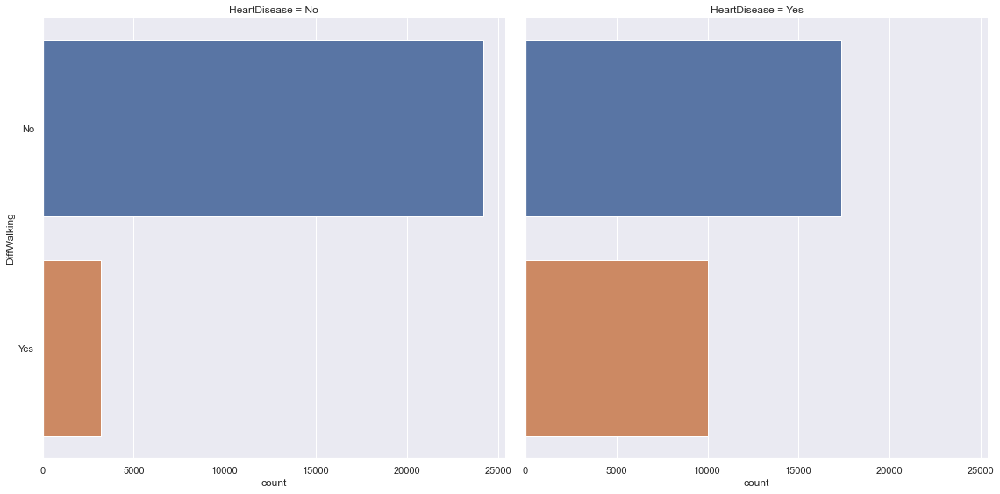

In [43]:
sb.catplot(y = 'DiffWalking', data = dataset, col = 'HeartDisease', kind = 'count', col_wrap = 2, height = 8)

## Comparing Race against HeartDisease

Race: 6
White                             43346
Hispanic                           3932
Black                              3659
Other                              1843
Asian                               989
American Indian/Alaskan Native      977
Name: Race, dtype: int64


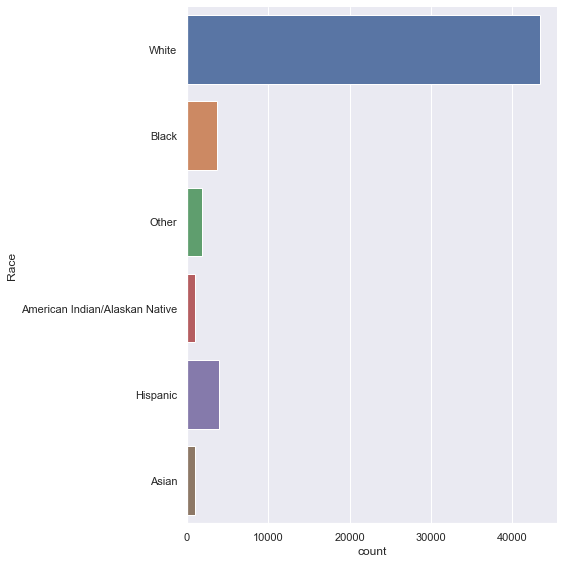

In [44]:
#General Statistics for Race
print("Race:", len(dataset["Race"].unique()))
print(dataset["Race"].value_counts())

sb.catplot(y = "Race", data = dataset, kind = "count", height=8)

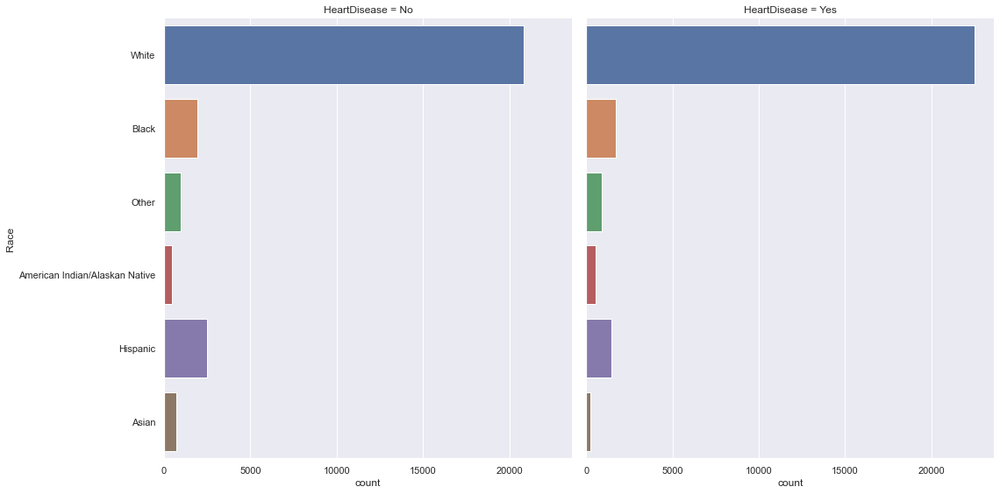

In [45]:
sb.catplot(y = 'Race', data = dataset, col = 'HeartDisease', kind = 'count', col_wrap = 2, height = 8)

Race is generally not a deciding factor in determining the risk of heart disease. For this particular dataset, the number of heart disease sufferers and non-heart disease sufferers had similar distributions across all of the races that were included in this dataset.

## Machine Learning

we would be setting up a multi-variate classification problem

Response Variable: Heart Disease

Predictor Variable: BMI, Smoking, Alcohol Drinking, Stroke, Physical Health, Mental Health, Difficulty Walking, Sex, Age Category, Race, Diabetic, Physical Activity, General Health, Sleep Time, Asthma, Kidney Disease, Skin Cancer.

In [46]:
predictors = ["Smoking", "AlcoholDrinking", "Stroke", "DiffWalking", "Sex", "AgeCategory", "Race", "Diabetic", "PhysicalActivity", "GenHealth", "Asthma", "KidneyDisease", "SkinCancer"]
dataset = pd.get_dummies(dataset, columns = predictors)
dataset = dataset.drop(['Smoking_No', 'AlcoholDrinking_No', 'Stroke_No', 'DiffWalking_No', 'PhysicalActivity_No', 'Asthma_No', 'KidneyDisease_No', 'SkinCancer_No'], axis = 1)
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 54746 entries, 1 to 319790
Data columns (total 43 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   HeartDisease                         54746 non-null  object 
 1   BMI                                  54746 non-null  float64
 2   PhysicalHealth                       54746 non-null  float64
 3   MentalHealth                         54746 non-null  float64
 4   SleepTime                            54746 non-null  float64
 5   Smoking_Yes                          54746 non-null  uint8  
 6   AlcoholDrinking_Yes                  54746 non-null  uint8  
 7   Stroke_Yes                           54746 non-null  uint8  
 8   DiffWalking_Yes                      54746 non-null  uint8  
 9   Sex_Female                           54746 non-null  uint8  
 10  Sex_Male                             54746 non-null  uint8  
 11  AgeCategory_18-24          

In [47]:
# Extract Response and Predictors
y = pd.DataFrame(dataset['HeartDisease'])
X = dataset.drop('HeartDisease', axis = 1)

Set up the classification problem with Train and Test datasets.

In [48]:
# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

# Check the sample sizes
print("Train Set :", y_train.shape, X_train.shape)
print("Test Set  :", y_test.shape, X_test.shape)

Train Set : (41059, 1) (41059, 42)
Test Set  : (13687, 1) (13687, 42)


### Basic Exploration of train set

In [49]:
y_train["HeartDisease"].value_counts()

Yes    20568
No     20491
Name: HeartDisease, dtype: int64

In [50]:
X_train.describe()

,BMI,PhysicalHealth,MentalHealth,SleepTime,Smoking_Yes,AlcoholDrinking_Yes,Stroke_Yes,DiffWalking_Yes,Sex_Female,Sex_Male,...,Diabetic_Yes (during pregnancy),PhysicalActivity_Yes,GenHealth_Excellent,GenHealth_Fair,GenHealth_Good,GenHealth_Poor,GenHealth_Very good,Asthma_Yes,KidneyDisease_Yes,SkinCancer_Yes
count,41059.000000,41059.000000,41059.000000,41059.000000,41059.000000,41059.000000,41059.000000,41059.000000,41059.000000,41059.000000,...,41059.000000,41059.000000,41059.000000,41059.000000,41059.000000,41059.000000,41059.000000,41059.000000,41059.000000,41059.000000
mean,28.836194,5.421247,4.292311,7.107455,0.493314,0.056285,0.093962,0.242578,0.473027,0.526973,...,0.006186,0.713364,0.139482,0.176843,0.315327,0.083392,0.284956,0.154534,0.076987,0.131567
std,6.510614,9.975976,8.586395,1.617346,0.499961,0.230474,0.291780,0.428647,0.499278,0.499278,...,0.078410,0.452196,0.346453,0.381540,0.464652,0.276477,0.451399,0.361464,0.266574,0.338023
min,12.210000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,24.390000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,27.800000,0.000000,0.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,...,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,32.080000,5.000000,4.000000,8.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,...,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000
max,88.190000,30.000000,30.000000,24.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


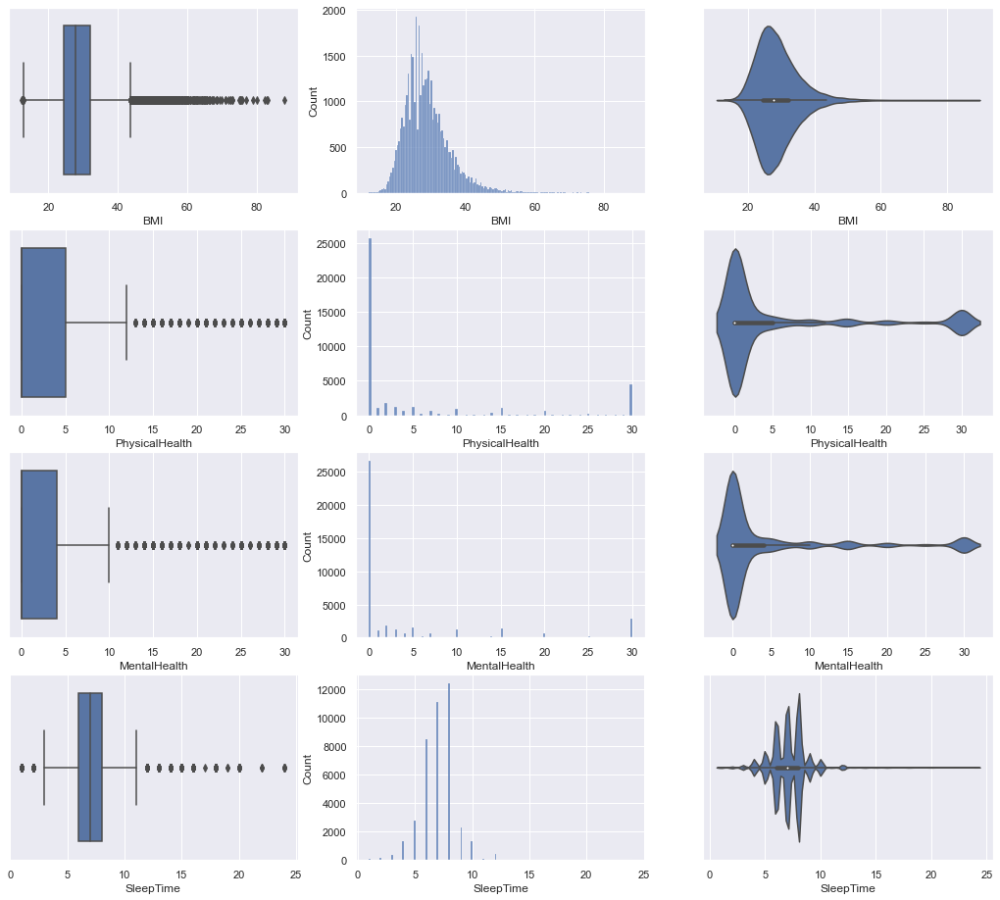

In [51]:
import warnings
warnings.filterwarnings("ignore")

# Draw the distributions of all Predictors that are non-categorical
f, axes = plt.subplots(4, 3, figsize=(18, 16))

count = 0
for var in X_train:
    if(count == 4): break
    sb.boxplot(X_train[var], orient = "h", ax = axes[count,0])
    sb.histplot(X_train[var], ax = axes[count,1])
    sb.violinplot(X_train[var], orient = "h", ax = axes[count,2])
    count += 1

### Classification Tree

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.7647044496943423

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.7398991743990648



<AxesSubplot:>

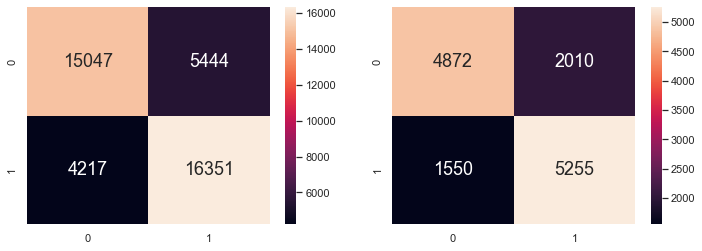

In [52]:
# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 9)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

# Predict Response corresponding to Predictors
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

We are able to get a better ratio for the positive to false postive ratio for test dataset when reducing the amount of data for having no heart disease to the same amount as having heart disease.

By taking 10 data from the dataset, we use the classification Tree derived above to predict on whether one has heart disease or not.

In [53]:
# Plot the trained Decision Tree
from sklearn.tree import plot_tree


f = plt.figure(figsize=(800,30))

plot_tree(dectree, filled=True, rounded=True, 
          feature_names=X_train.columns, 
          class_names=["No","Yes"], fontsize = 15)

[Text(24484.33372641509, 1549.26, 'DiffWalking_Yes <= 0.5\ngini = 0.5\nsamples = 41059\nvalue = [20491, 20568]\nclass = Yes'),
 Text(13202.051886792451, 1386.18, 'Diabetic_Yes <= 0.5\ngini = 0.487\nsamples = 31099\nvalue = [18093, 13006]\nclass = No'),
 Text(7652.759433962264, 1223.1, 'AgeCategory_80 or older <= 0.5\ngini = 0.465\nsamples = 26051\nvalue = [16489, 9562]\nclass = No'),
 Text(4246.415094339623, 1060.02, 'GenHealth_Excellent <= 0.5\ngini = 0.443\nsamples = 23481\nvalue = [15692, 7789]\nclass = No'),
 Text(2246.0377358490564, 896.94, 'GenHealth_Very good <= 0.5\ngini = 0.472\nsamples = 18488\nvalue = [11413, 7075]\nclass = No'),
 Text(1123.0188679245282, 733.86, 'AgeCategory_70-74 <= 0.5\ngini = 0.5\nsamples = 9678\nvalue = [4929, 4749]\nclass = No'),
 Text(561.5094339622641, 570.78, 'AgeCategory_75-79 <= 0.5\ngini = 0.495\nsamples = 8263\nvalue = [4541, 3722]\nclass = No'),
 Text(280.75471698113205, 407.70000000000005, 'AgeCategory_65-69 <= 0.5\ngini = 0.482\nsamples = 712

In [54]:
dataset_pred = dataset.sample(10)
dataset_pred

,HeartDisease,BMI,PhysicalHealth,MentalHealth,SleepTime,Smoking_Yes,AlcoholDrinking_Yes,Stroke_Yes,DiffWalking_Yes,Sex_Female,...,Diabetic_Yes (during pregnancy),PhysicalActivity_Yes,GenHealth_Excellent,GenHealth_Fair,GenHealth_Good,GenHealth_Poor,GenHealth_Very good,Asthma_Yes,KidneyDisease_Yes,SkinCancer_Yes
275847,No,27.98,0.0,0.0,8.0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0
233765,No,22.50,0.0,0.0,9.0,0,0,0,0,1,...,0,1,0,0,0,0,1,0,0,0
119153,No,33.96,0.0,0.0,7.0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
182144,No,23.39,30.0,2.0,8.0,1,0,0,1,0,...,0,0,0,0,1,0,0,0,0,1
18984,No,31.46,0.0,0.0,8.0,0,0,0,0,0,...,0,1,1,0,0,0,0,0,0,0
69882,No,26.39,2.0,7.0,8.0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0
306450,No,28.25,0.0,0.0,9.0,0,0,0,0,1,...,0,1,0,0,1,0,0,0,0,0
58504,No,27.41,0.0,0.0,8.0,0,0,0,0,1,...,0,1,0,0,0,0,1,1,0,0
150496,Yes,27.34,5.0,0.0,8.0,1,0,0,1,0,...,0,1,0,0,1,0,0,0,0,1
183,Yes,35.15,0.0,0.0,8.0,1,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0


In [55]:
# Extract Predictors for Prediction
X_pred = dataset_pred.drop('HeartDisease', axis = 1)

# Predict Response corresponding to Predictors
y_pred = dectree.predict(X_pred)

In [56]:
# Summarize the Actuals and Predictions
y_pred = pd.DataFrame(y_pred, columns = ["PredHeartDisease"], index = dataset_pred.index)
dataset_acc = pd.concat([dataset_pred["HeartDisease"], y_pred], axis = 1)

In [57]:
y_prob = dectree.predict_proba(X_pred)

In [58]:
y_prob = pd.DataFrame(list(y_prob[:,1]), columns = ["ProbHeartDisease"], index = dataset_pred.index)
dataset_conf = pd.concat([dataset_acc, y_prob], axis = 1)

dataset_conf

,HeartDisease,PredHeartDisease,ProbHeartDisease
275847,No,Yes,0.725389
233765,No,No,0.114658
119153,No,Yes,0.720732
182144,No,Yes,0.672131
18984,No,No,0.074398
69882,No,No,0.114658
306450,No,Yes,0.527820
58504,No,No,0.344444
150496,Yes,Yes,0.840989
183,Yes,Yes,0.795880


### Linear Regression

Using the probability of the classificaton tree, we perform linear regression with the variables.

In [59]:
y_train = dectree.predict_proba(X_train)
y_train = pd.DataFrame(list(y_train[:,1]), columns = ["ProbHeartDisease"], index = X_train.index)

y_test = dectree.predict_proba(X_test)
y_test = pd.DataFrame(list(y_test[:,1]), columns = ["ProbHeartDisease"], index = X_test.index)

<AxesSubplot:>

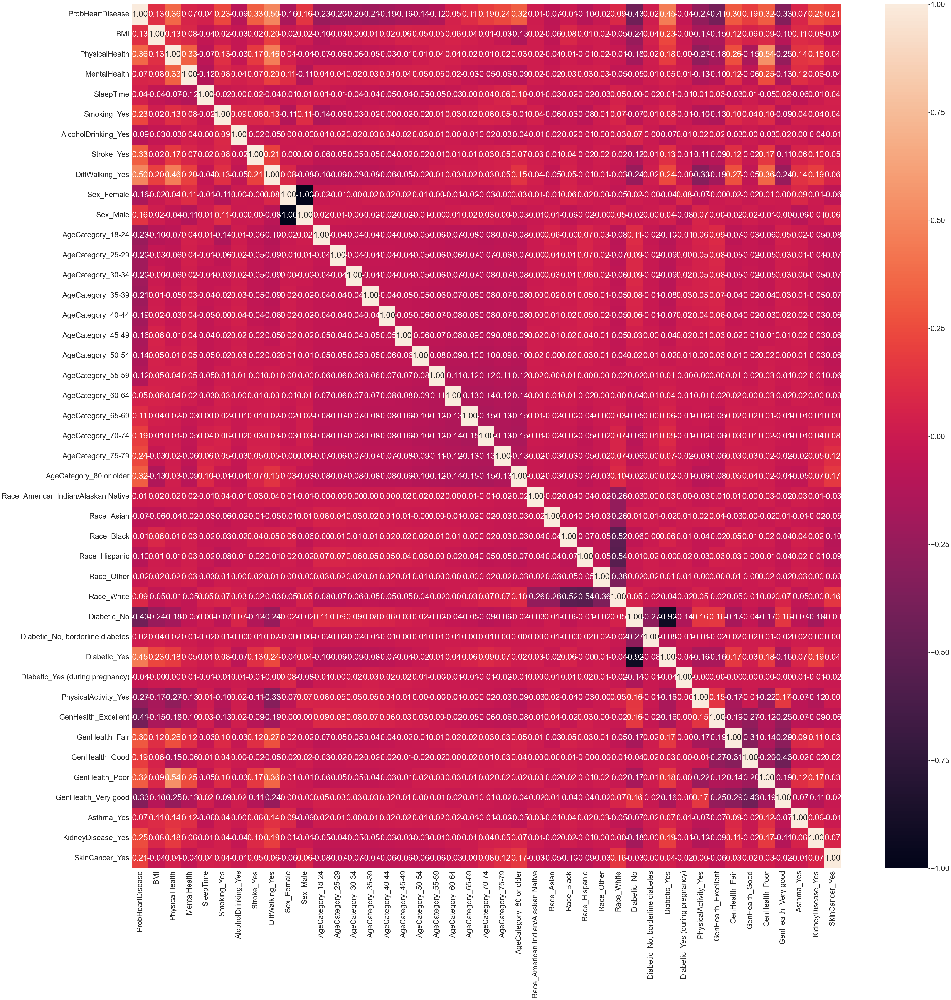

In [60]:
# Correlation between Response and the Predictors
trainDF = pd.concat([y_train, X_train], axis = 1).reindex(y_train.index)

f = plt.figure(figsize=(70, 70))
sb.set(font_scale=3)
sb.heatmap(trainDF.corr(), vmin = -1, vmax = 1, annot = True, fmt = ".2f")

Intercept of Regression 	: b =  [0.39366577]
Coefficients of Regression 	: a =  [[-1.96611501e-05  6.68994708e-04  7.15467816e-04 -8.99553914e-04
   2.63222213e-02 -1.96589301e-02  1.24877157e-01  1.06150610e-01
  -4.64751378e-02  4.64751378e-02 -1.30698013e-01 -1.30799716e-01
  -1.25970177e-01 -1.34294253e-01 -1.21798750e-01 -9.17235357e-02
  -7.33383913e-02 -5.30502169e-02  8.25110772e-02  1.26095379e-01
   1.68540431e-01  2.22478458e-01  2.62047708e-01  6.85360742e-03
  -3.83495564e-06 -6.76227654e-03 -2.36709797e-03 -4.63061236e-03
   6.91021440e-03 -4.15454741e-02 -2.97247662e-02  8.64605542e-02
  -1.51903139e-02 -1.54910067e-03 -1.71905560e-01  8.09099037e-02
   6.01926453e-02  1.32823344e-01 -1.02020333e-01  1.58132206e-02
   4.10193267e-02  1.28615537e-02]]

                             Predictors  Coefficients
0                                   BMI     -0.000020
1                        PhysicalHealth      0.000669
2                          MentalHealth      0.000715
3      

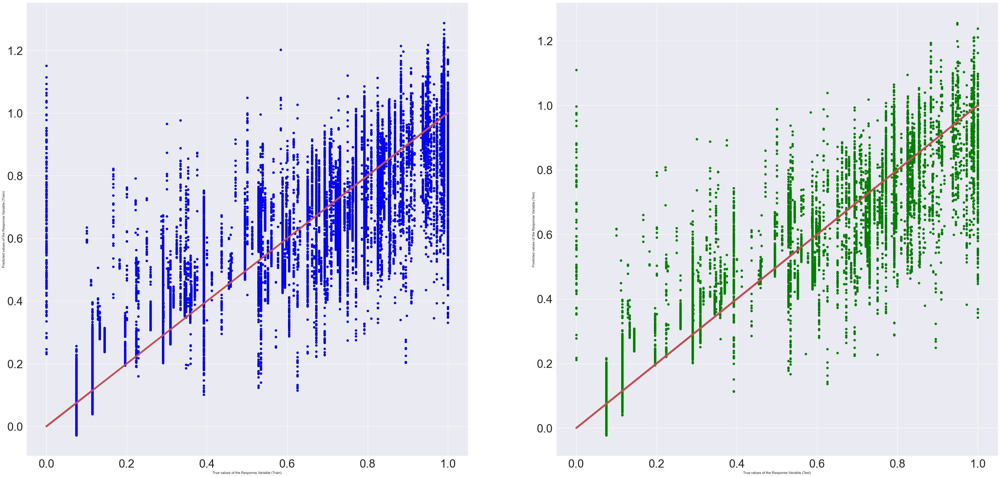

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.8021522718744496
Mean Squared Error (MSE) 	: 0.017204872732567527

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.7992628057776073
Mean Squared Error (MSE) 	: 0.017263645064763945



In [61]:
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Print the Coefficients against Predictors
print(pd.DataFrame(list(zip(X_train.columns, linreg.coef_[0])), columns = ["Predictors", "Coefficients"]))
print()

# Predict Response corresponding to Predictors
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(50, 24))
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'r-', linewidth = 5)
axes[0].set_xlabel("True values of the Response Variable (Train)", fontsize = 10)
axes[0].set_ylabel("Predicted values of the Response Variable (Train)", fontsize = 10)
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'r-', linewidth = 5)
axes[1].set_xlabel("True values of the Response Variable (Test)", fontsize = 10)
axes[1].set_ylabel("Predicted values of the Response Variable (Test)", fontsize = 10)
plt.show()

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

In [62]:
dataset_pred = dataset.sample(10)
dataset_pred

,HeartDisease,BMI,PhysicalHealth,MentalHealth,SleepTime,Smoking_Yes,AlcoholDrinking_Yes,Stroke_Yes,DiffWalking_Yes,Sex_Female,...,Diabetic_Yes (during pregnancy),PhysicalActivity_Yes,GenHealth_Excellent,GenHealth_Fair,GenHealth_Good,GenHealth_Poor,GenHealth_Very good,Asthma_Yes,KidneyDisease_Yes,SkinCancer_Yes
304539,Yes,29.41,3.0,3.0,5.0,1,0,0,0,0,...,0,1,0,0,1,0,0,0,0,0
9791,Yes,23.25,0.0,0.0,6.0,0,0,0,1,0,...,0,1,0,0,1,0,0,0,0,1
238549,No,29.62,2.0,7.0,6.0,1,0,0,0,1,...,0,1,0,1,0,0,0,0,0,0
93640,Yes,26.46,30.0,30.0,8.0,1,0,1,1,1,...,0,0,0,0,0,1,0,1,0,0
41734,Yes,36.51,12.0,0.0,8.0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,1,0
107505,No,38.01,30.0,0.0,7.0,1,0,0,1,0,...,0,1,0,0,1,0,0,0,0,0
68720,No,21.11,30.0,0.0,8.0,0,0,0,1,0,...,0,0,0,0,1,0,0,0,0,0
235353,No,23.67,5.0,0.0,8.0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0
156759,Yes,28.48,0.0,0.0,9.0,1,0,1,0,0,...,0,1,0,0,1,0,0,0,0,0
250447,No,24.22,0.0,30.0,8.0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0


In [63]:
# Extract Predictors for Prediction
X_prob = dataset_pred.drop('HeartDisease', axis = 1)

# Predict Response corresponding to Predictors
y_pred = linreg.predict(X_prob)
y_prob = linreg.predict(X_prob)

In [64]:
# Summarize the Actuals and Predictions
y_pred = pd.DataFrame(y_pred, columns = ["PredHeartDisease"], index = dataset_pred.index)
y_prob = pd.DataFrame(y_prob, columns = ["ProbHeartDisease"], index = dataset_pred.index)
y_pred.where(y_pred < 0.5, 1, inplace = True)
y_pred.where(y_pred >= 0.5, 0, inplace = True)
y_pred['PredHeartDisease'] = y_pred['PredHeartDisease'].map({1: 'Yes', 0: 'No'})
dataset_acc = pd.concat([dataset_pred["HeartDisease"], y_pred], axis = 1)
dataset_conf = pd.concat([dataset_acc, y_prob], axis = 1)

dataset_conf

,HeartDisease,PredHeartDisease,ProbHeartDisease
304539,Yes,No,0.367750
9791,Yes,Yes,0.799785
238549,No,No,0.326881
93640,Yes,Yes,1.006404
41734,Yes,Yes,0.754451
107505,No,Yes,0.778188
68720,No,Yes,0.858176
235353,No,No,0.466160
156759,Yes,Yes,0.829171
250447,No,No,0.184928
